# Выбор локации для скважины

**Описание проекта**: Добывающей компании «ГлавРосГосНефть» необходимо решить, где бурить новую скважину. Для анализа предоставлены пробы нефти в трёх регионах. Характеристики для каждой скважины в регионе уже известны. Необходимо построить модель для определения региона, где добыча принесёт наибольшую прибыль, а также проанализировать возможную прибыль и риски техникой Bootstrap.

**Цель исследования**: Построить модель машинного обучения для предсказания объёма запасов в новых скважинах. Проанализировать возможную прибыль и риски техникой Bootstrap.

**Ход исследования:**

- *Шаг 1.* Подготовка и предобработка данных.
- *Шаг 2.* Обучение и анализ модели. 
- *Шаг 3.* Расчёт прибыли и рисков.
- *Шаг 4.* Выводы.

*Условия задачи*:
- Для обучения модели подходит только линейная регрессия (остальные — недостаточно предсказуемые).
- При разведке региона исследуют 500 точек, из которых с помощью машинного обучения выбирают 200 лучших для разработки.
- Бюджет на разработку скважин в регионе — 10 млрд рублей.
- При нынешних ценах один баррель сырья приносит 450 рублей дохода. Доход с каждой единицы продукта составляет 450 тыс. рублей, поскольку объём указан в тысячах баррелей.
- После оценки рисков нужно оставить лишь те регионы, в которых вероятность убытков меньше 2.5%. Среди них выбирают регион с наибольшей средней прибылью.
- Данные синтетические: детали контрактов и характеристики месторождений не разглашаются.

**Общий вывод**: По итогам проведенного анализа и разработки модели машинного обучения появится возможность определить регион, где добыча принесёт наибольшую прибыль. 

**Описание данных**

Данные геологоразведки трёх регионов имеют следующие признаки:
- `id` —  уникальный идентификатор скважины;
- `f0`, `f1`, `f2` — три признака точек (неважно, что они означают, но сами признаки значимы);
- `product` — объём запасов в скважине (тыс. баррелей);

In [1]:
# Импортируем библиотеки, которые понадобятся для работы над проектом. 
import time
import warnings

# для датафрейма 
import pandas as pd
import numpy as np

# для визуализации 
import matplotlib
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

# для машинного обучения
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler

# модели 
from sklearn.linear_model import LinearRegression

# метрики
from sklearn.metrics import mean_squared_error

In [2]:
# Пробуем ширококоформатный Jupyter
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [3]:
# Зафисируем константы

RANDOM_STATE = 42

## Подготовка и предобработка данных

In [4]:
# Функция вывода основной информации о файлах-датафреймах

def main_info(df):
    # Информация о структуре датафрейма
    print("Информация о структурах:")
    display(df.info())
    print("\n")
    print('-----')
    
    # Статистическое описание колонок
    print("Статистика:")
    display(df.describe().T)
    print("\n")
    print('-----')
    
    # Первые десять строк датафрейма
    print("Первые строки:")
    display(df.head(10))
    print("\n")
    print('-----')
    
    # Информация о дубликатах
    print("Количество явных дубликатов в датафрейме:")
    display(df.duplicated().sum())
    print("\n")
    print('-----')
    
    # Информация о пропусках
    print("Количество пропусков в датафрейме:")
    display(df.isna().sum())
    print("\n")
    print('-----')
    

In [5]:
# Считаем данные из csv-файлов в датафрейм и сохраним в переменные. 

try:
    geo_data_0 = pd.read_csv('/datasets/geo_data_0.csv')
except:
    geo_data_0 = pd.read_csv('https://code.s3.yandex.net/datasets/geo_data_0.csv')
    
try:
    geo_data_1 = pd.read_csv('/datasets/geo_data_1.csv')
except:
    geo_data_1 = pd.read_csv('https://code.s3.yandex.net/datasets/geo_data_1.csv')
    
try:
    geo_data_2 = pd.read_csv('/datasets/geo_data_2.csv')
except:
    geo_data_2 = pd.read_csv('https://code.s3.yandex.net/datasets/geo_data_2.csv')

In [6]:
# Выведем основную информацию о датафрейме geo_data_0

main_info(geo_data_0)

Информация о структурах:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB


None



-----
Статистика:


,count,mean,std,min,25%,50%,75%,max
f0,100000.0,0.500419,0.871832,-1.408605,-0.072580,0.502360,1.073581,2.362331
f1,100000.0,0.250143,0.504433,-0.848218,-0.200881,0.250252,0.700646,1.343769
f2,100000.0,2.502647,3.248248,-12.088328,0.287748,2.515969,4.715088,16.003790
product,100000.0,92.500000,44.288691,0.000000,56.497507,91.849972,128.564089,185.364347




-----
Первые строки:


,id,f0,f1,f2,product
0,txEyH,0.705745,-0.497823,1.221170,105.280062
1,2acmU,1.334711,-0.340164,4.365080,73.037750
2,409Wp,1.022732,0.151990,1.419926,85.265647
3,iJLyR,-0.032172,0.139033,2.978566,168.620776
4,Xdl7t,1.988431,0.155413,4.751769,154.036647
5,wX4Hy,0.969570,0.489775,-0.735383,64.741541
6,tL6pL,0.645075,0.530656,1.780266,49.055285
7,BYPU6,-0.400648,0.808337,-5.624670,72.943292
8,j9Oui,0.643105,-0.551583,2.372141,113.356160
9,OLuZU,2.173381,0.563698,9.441852,127.910945




-----
Количество явных дубликатов в датафрейме:


0



-----
Количество пропусков в датафрейме:


id         0
f0         0
f1         0
f2         0
product    0
dtype: int64



-----


**Комментарии**

Датасет из файла `geo_data_0.csv` мы сохранили в переменную `geo_data_0`. Он содержит 100000 строк, пропусков и явных дубликатов нет, типы данных распределены корректно, названия столбцов соответствуют правилам snake_case. 

In [7]:
# Выведем основную информацию о датафрейме geo_data_1

main_info(geo_data_1)

Информация о структурах:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB


None



-----
Статистика:


,count,mean,std,min,25%,50%,75%,max
f0,100000.0,1.141296,8.965932,-31.609576,-6.298551,1.153055,8.621015,29.421755
f1,100000.0,-4.796579,5.119872,-26.358598,-8.267985,-4.813172,-1.332816,18.734063
f2,100000.0,2.494541,1.703572,-0.018144,1.000021,2.011479,3.999904,5.019721
product,100000.0,68.825000,45.944423,0.000000,26.953261,57.085625,107.813044,137.945408




-----
Первые строки:


,id,f0,f1,f2,product
0,kBEdx,-15.001348,-8.276000,-0.005876,3.179103
1,62mP7,14.272088,-3.475083,0.999183,26.953261
2,vyE1P,6.263187,-5.948386,5.001160,134.766305
3,KcrkZ,-13.081196,-11.506057,4.999415,137.945408
4,AHL4O,12.702195,-8.147433,5.004363,134.766305
5,HHckp,-3.327590,-2.205276,3.003647,84.038886
6,h5Ujo,-11.142655,-10.133399,4.002382,110.992147
7,muH9x,4.234715,-0.001354,2.004588,53.906522
8,YiRkx,13.355129,-0.332068,4.998647,134.766305
9,jG6Gi,1.069227,-11.025667,4.997844,137.945408




-----
Количество явных дубликатов в датафрейме:


0



-----
Количество пропусков в датафрейме:


id         0
f0         0
f1         0
f2         0
product    0
dtype: int64



-----


**Комментарии**

Датасет из файла `geo_data_1.csv` мы сохранили в переменную `geo_data_1`. Он содержит 100000 строк, пропусков и дубликатов нет, типы данных распределены корректно, названия столбцов соответствуют правилам snake_case. 

In [8]:
# Выведем основную информацию о датафрейме geo_data_2

main_info(geo_data_2)

Информация о структурах:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB


None



-----
Статистика:


,count,mean,std,min,25%,50%,75%,max
f0,100000.0,0.002023,1.732045,-8.760004,-1.162288,0.009424,1.158535,7.238262
f1,100000.0,-0.002081,1.730417,-7.084020,-1.174820,-0.009482,1.163678,7.844801
f2,100000.0,2.495128,3.473445,-11.970335,0.130359,2.484236,4.858794,16.739402
product,100000.0,95.000000,44.749921,0.000000,59.450441,94.925613,130.595027,190.029838




-----
Первые строки:


,id,f0,f1,f2,product
0,fwXo0,-1.146987,0.963328,-0.828965,27.758673
1,WJtFt,0.262778,0.269839,-2.530187,56.069697
2,ovLUW,0.194587,0.289035,-5.586433,62.871910
3,q6cA6,2.236060,-0.553760,0.930038,114.572842
4,WPMUX,-0.515993,1.716266,5.899011,149.600746
5,LzZXx,-0.758092,0.710691,2.585887,90.222465
6,WBHRv,-0.574891,0.317727,1.773745,45.641478
7,XO8fn,-1.906649,-2.458350,-0.177097,72.480640
8,ybmQ5,1.776292,-0.279356,3.004156,106.616832
9,OilcN,-1.214452,-0.439314,5.922514,52.954532




-----
Количество явных дубликатов в датафрейме:


0



-----
Количество пропусков в датафрейме:


id         0
f0         0
f1         0
f2         0
product    0
dtype: int64



-----


**Комментарии**

Датасет из файла `geo_data_2.csv` мы сохранили в переменную `geo_data_2`. Он содержит 100000 строк, пропусков и дубликатов нет, типы данных распределены корректно, названия столбцов соответствуют правилам snake_case. 

### Обработка дубликатов

In [9]:
# Проверим неявные дубликаты в 'geo_data_0'

id_duplicates_0 = geo_data_0['id'].value_counts() # подсчет количества вхождений каждой записи в столбце 'id'
duplicate_id_0 = id_duplicates_0[id_duplicates_0 > 1].index # отбираем только те id, которые имеют больше одной записи (дублируются)

print('Количество неявных дубликатов в столбце id в "geo_data_0":', len(geo_data_0) - id_duplicates_0.count())
print("Строки с неявными дубликатами:")
display(geo_data_0[geo_data_0['id'].isin(duplicate_id_0)])

Количество неявных дубликатов в столбце id в "geo_data_0": 10
Строки с неявными дубликатами:


,id,f0,f1,f2,product
931,HZww2,0.755284,0.368511,1.863211,30.681774
1364,bxg6G,0.411645,0.856830,-3.653440,73.604260
1949,QcMuo,0.506563,-0.323775,-2.215583,75.496502
3389,A5aEY,-0.039949,0.156872,0.209861,89.249364
7530,HZww2,1.061194,-0.373969,10.430210,158.828695
16633,fiKDv,0.157341,1.028359,5.585586,95.817889
21426,Tdehs,0.829407,0.298807,-0.049563,96.035308
41724,bxg6G,-0.823752,0.546319,3.630479,93.007798
42529,AGS9W,1.454747,-0.479651,0.683380,126.370504
51970,A5aEY,-0.180335,0.935548,-2.094773,33.020205


In [10]:
# Удалим дубликаты в 'geo_data_0'

print('Количество строк до удаления дубликатов в столбце "id":', len(geo_data_0))
geo_data_0 = geo_data_0.drop_duplicates(subset='id', keep="first")
print('Количество строк после удаления дубликатов в столбце "id":', len(geo_data_0))


Количество строк до удаления дубликатов в столбце "id": 100000
Количество строк после удаления дубликатов в столбце "id": 99990


In [11]:
# Проверим неявные дубликаты в 'geo_data_1'

id_duplicates_1 = geo_data_1['id'].value_counts() # подсчет количества вхождений каждой записи в столбце 'id'
duplicate_id_1 = id_duplicates_1[id_duplicates_1 > 1].index # отбираем только те id, которые имеют больше одной записи (дублируются)

print('Количество неявных дубликатов в столбце id в "geo_data_1":', len(geo_data_1) - id_duplicates_1.count())
print("Строки с неявными дубликатами:")
display(geo_data_1[geo_data_1['id'].isin(duplicate_id_1)])

Количество неявных дубликатов в столбце id в "geo_data_1": 4
Строки с неявными дубликатами:


,id,f0,f1,f2,product
1305,LHZR0,11.170835,-1.945066,3.002872,80.859783
2721,bfPNe,-9.494442,-5.463692,4.006042,110.992147
5849,5ltQ6,-3.435401,-12.296043,1.999796,57.085625
41906,LHZR0,-8.989672,-4.286607,2.009139,57.085625
47591,wt4Uk,-9.091098,-8.109279,-0.002314,3.179103
82178,bfPNe,-6.202799,-4.820045,2.995107,84.038886
82873,wt4Uk,10.259972,-9.376355,4.994297,134.766305
84461,5ltQ6,18.213839,2.191999,3.993869,107.813044


In [12]:
# Удалим дубликаты в 'geo_data_1'

print('Количество строк до удаления дубликатов в столбце "id":', len(geo_data_1))
geo_data_1 = geo_data_1.drop_duplicates(subset='id', keep="first")
print('Количество строк после удаления дубликатов в столбце "id":', len(geo_data_1))


Количество строк до удаления дубликатов в столбце "id": 100000
Количество строк после удаления дубликатов в столбце "id": 99996


In [13]:
# Проверим неявные дубликаты в 'geo_data_2'

id_duplicates_2 = geo_data_2['id'].value_counts() # подсчет количества вхождений каждой записи в столбце 'id'
duplicate_id_2 = id_duplicates_2[id_duplicates_2 > 1].index # отбираем только те id, которые имеют больше одной записи (дублируются)

print('Количество неявных дубликатов в столбце id в "geo_data_2":', len(geo_data_2) - id_duplicates_2.count())
print("Строки с неявными дубликатами:")
display(geo_data_2[geo_data_2['id'].isin(duplicate_id_2)])

Количество неявных дубликатов в столбце id в "geo_data_2": 4
Строки с неявными дубликатами:


,id,f0,f1,f2,product
11449,VF7Jo,2.122656,-0.858275,5.746001,181.716817
28039,xCHr8,1.633027,0.368135,-2.378367,6.120525
43233,xCHr8,-0.847066,2.101796,5.597130,184.388641
44378,Vcm5J,-1.229484,-2.439204,1.222909,137.968290
45404,KUPhW,0.231846,-1.698941,4.990775,11.716299
49564,VF7Jo,-0.883115,0.560537,0.723601,136.233420
55967,KUPhW,1.211150,3.176408,5.543540,132.831802
95090,Vcm5J,2.587702,1.986875,2.482245,92.327572


In [14]:
# Удалим дубликаты в 'geo_data_2'

print('Количество строк до удаления дубликатов в столбце "id":', len(geo_data_2))
geo_data_2 = geo_data_2.drop_duplicates(subset='id', keep="first")
print('Количество строк после удаления дубликатов в столбце "id":', len(geo_data_2))


Количество строк до удаления дубликатов в столбце "id": 100000
Количество строк после удаления дубликатов в столбце "id": 99996


**Комментарии**

В датафрейме `geo_data_0` были обнаружены и удалены 10 дубликатов по столбцу `id`.

В датафрейме `geo_data_1` были обнаружены и удалены 4 дубликата по столбцу `id`.

В датафрейме `geo_data_2` были обнаружены и удалены 4 дубликата по столбцу `id`.

### Исследовательский анализ данных

In [15]:
# Перенесем столбец 'id' в индекс

geo_data_0.set_index('id', inplace=True)
geo_data_1.set_index('id', inplace=True)
geo_data_2.set_index('id', inplace=True)

# Проверим результат

display(geo_data_0.head(5))
print('-----')
display(geo_data_1.head(5))
print('-----')
display(geo_data_2.head(5))

,f0,f1,f2,product
id,,,,
txEyH,0.705745,-0.497823,1.221170,105.280062
2acmU,1.334711,-0.340164,4.365080,73.037750
409Wp,1.022732,0.151990,1.419926,85.265647
iJLyR,-0.032172,0.139033,2.978566,168.620776
Xdl7t,1.988431,0.155413,4.751769,154.036647


-----


,f0,f1,f2,product
id,,,,
kBEdx,-15.001348,-8.276000,-0.005876,3.179103
62mP7,14.272088,-3.475083,0.999183,26.953261
vyE1P,6.263187,-5.948386,5.001160,134.766305
KcrkZ,-13.081196,-11.506057,4.999415,137.945408
AHL4O,12.702195,-8.147433,5.004363,134.766305


-----


,f0,f1,f2,product
id,,,,
fwXo0,-1.146987,0.963328,-0.828965,27.758673
WJtFt,0.262778,0.269839,-2.530187,56.069697
ovLUW,0.194587,0.289035,-5.586433,62.871910
q6cA6,2.236060,-0.553760,0.930038,114.572842
WPMUX,-0.515993,1.716266,5.899011,149.600746


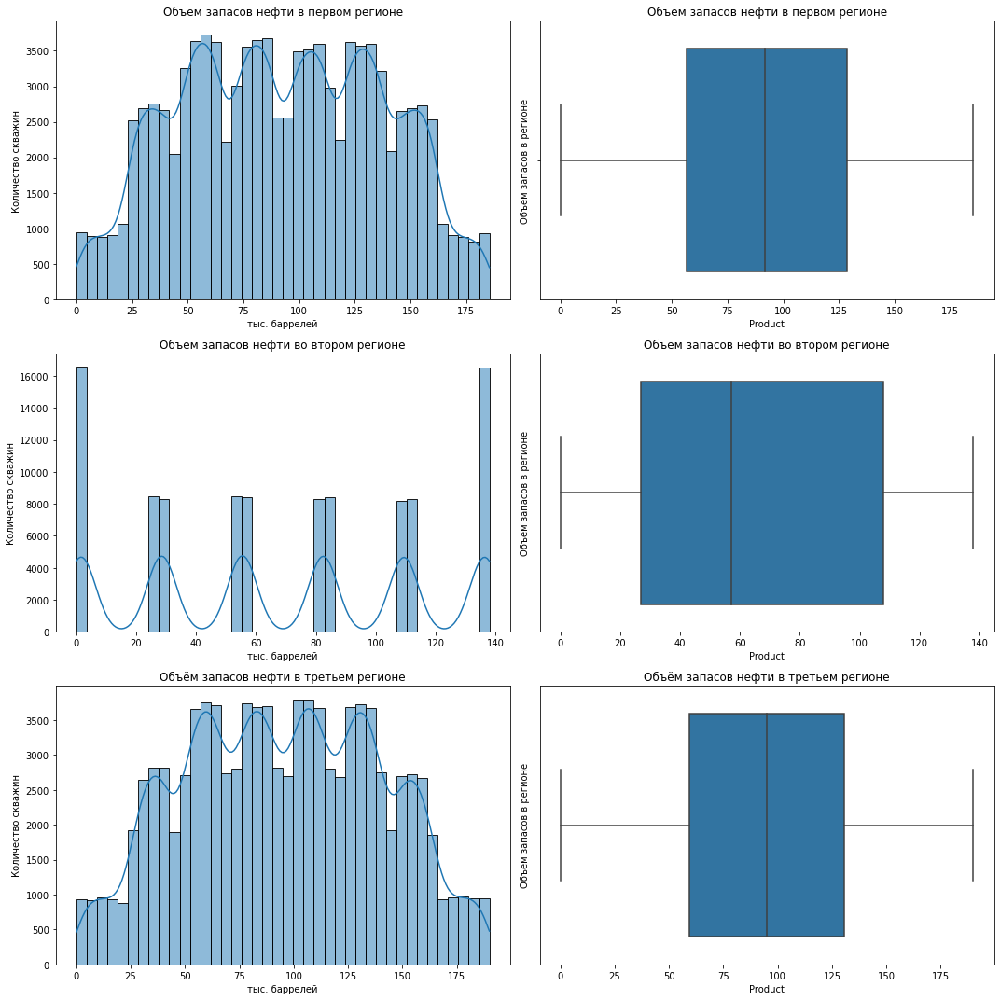

In [16]:
# Построим гистограммы и диаграммы размаха для целевого показателя `product` трех таблиц на одном графике.

columns = [geo_data_0['product'], geo_data_1['product'], geo_data_2['product']]
titles = ['Объём запасов нефти в первом регионе', 
          'Объём запасов нефти во втором регионе', 
          'Объём запасов нефти в третьем регионе']
xlabels = ['тыс. баррелей'] * len(columns)

# Создаем сетку графиков
fig, axes = plt.subplots(len(columns), 2, figsize=(15, 15))

for i, col in enumerate(columns):
    df = {'Product': col}
    data_df = pd.DataFrame(df)
    
    # Левый график — гистограмма
    sns.histplot(data=data_df, x="Product", ax=axes[i][0], bins=40, kde=True)
    axes[i][0].set_title(titles[i])
    axes[i][0].set_xlabel(xlabels[i])
    axes[i][0].set_ylabel('Количество скважин')
    
    # Правый график — диаграмма размаха
    sns.boxplot(x=data_df["Product"], orient='h', ax=axes[i][1]) 
    axes[i][1].set_title(titles[i])
    axes[i][1].set_ylabel('Объем запасов в регионе')

plt.tight_layout()
plt.show()

In [34]:
import matplotlib.gridspec as gridspec

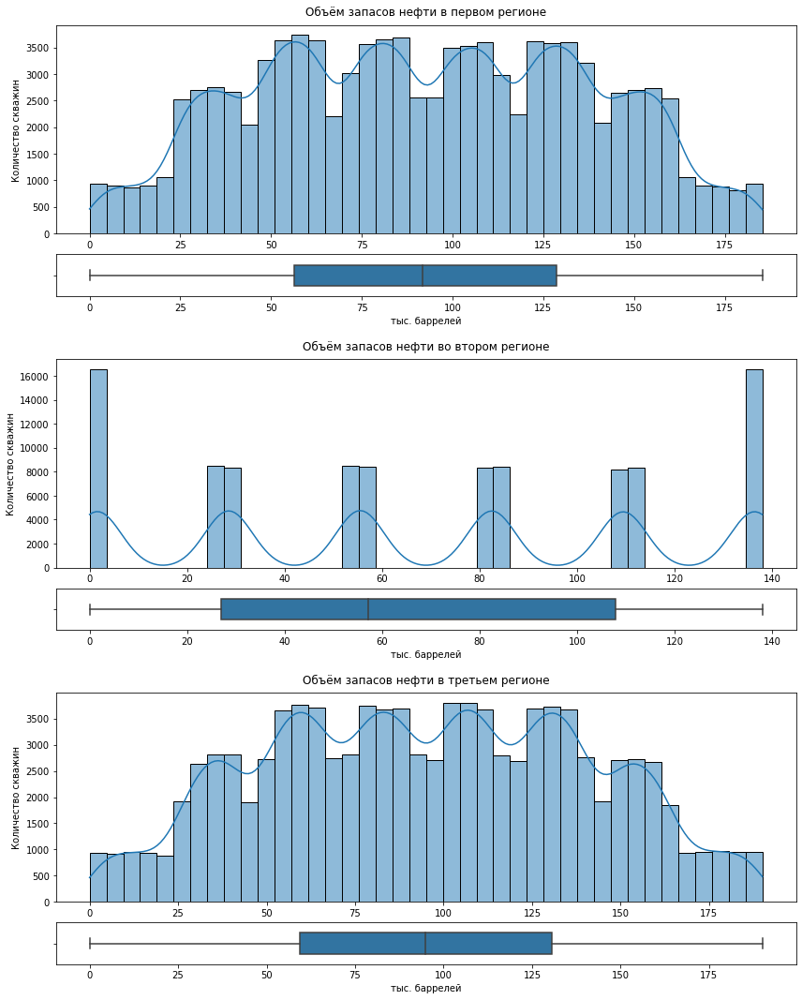

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Данные
columns = [geo_data_0['product'], geo_data_1['product'], geo_data_2['product']]
titles = ['Объём запасов нефти в первом регионе', 
          'Объём запасов нефти во втором регионе', 
          'Объём запасов нефти в третьем регионе']
xlabels = ['тыс. баррелей'] * len(columns)

# Создаем фигуру с 3 рядами и 1 колонкой (каждый регион — свой ряд)
fig, axes = plt.subplots(3, 1, figsize=(12, 15))

# Для каждого региона создаем две оси (гистограмма + боксплот)
for i, col in enumerate(columns):
    df = {'Product': col}
    data_df = pd.DataFrame(df)
    
    # Разделяем текущую ось на две: верхнюю (гистограмма) и нижнюю (боксплот)
    ax_hist = axes[i]  # Гистограмма будет здесь
    ax_box = ax_hist.inset_axes([0, -0.3, 1, 0.2])  # Боксплот внизу
    
    # Гистограмма
    sns.histplot(data=data_df, x="Product", ax=ax_hist, bins=40, kde=True)
    ax_hist.set_title(titles[i], pad=10)
    ax_hist.set_xlabel('')
    ax_hist.set_ylabel('Количество скважин')
    
    # Боксплот
    sns.boxplot(x=data_df["Product"], orient='h', ax=ax_box, width=0.5) 
    ax_box.set_xlabel(xlabels[i])
    ax_box.set_ylabel('')
    
    # Синхронизация осей X
    x_min = min(data_df["Product"].min(), ax_box.get_xlim()[0])
    x_max = max(data_df["Product"].max(), ax_box.get_xlim()[1])
    ax_hist.set_xlim(x_min, x_max)
    ax_box.set_xlim(x_min, x_max)

plt.tight_layout()
plt.show()

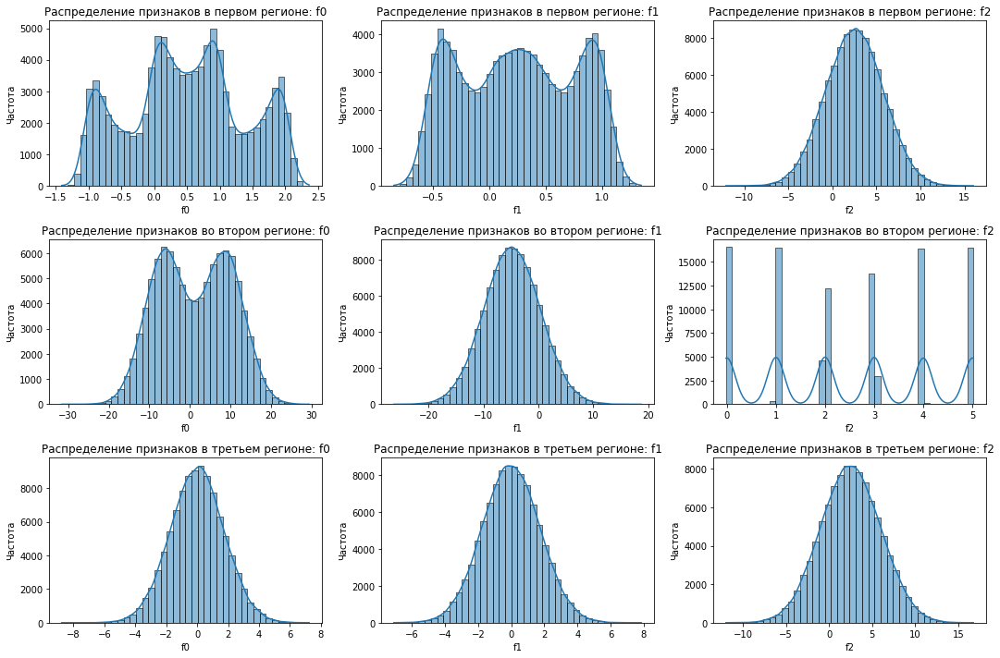

In [17]:
# Построим гистограммы для входных признаков трех таблиц на одном графике.

data = [geo_data_0, geo_data_1, geo_data_2]
columns = ['f0', 'f1', 'f2']
titles = ['Распределение признаков в первом регионе', 
          'Распределение признаков во втором регионе', 
          'Распределение признаков в третьем регионе']

# Создаем сетку графиков
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))

for idx, df in enumerate(data):
    title = titles[idx]
    region_axes = axes[idx]
    
    # Строим гистограммы для каждого признака
    for jdx, column in enumerate(columns):
        current_ax = region_axes[jdx]
        
        # Рисуем гистограмму
        sns.histplot(data=df[column], ax=current_ax, bins=40, kde=True)
        current_ax.set_title(f'{title}: {column}')
        current_ax.set_xlabel(column)
        current_ax.set_ylabel('Частота')

# Регулировка расстояния между подграфиками
plt.tight_layout()
plt.show()

**Комментарии**

Все входные признаки в третьем регионе имеют вид нормального распределения, тогда как в первом и втором регионе вид нормального распределения имеют только по одному признаку `f2` и `f1` соответственно. Распределение признака `f2` во втором регионе похоже на распределение целевого признака и имеет дискретный характер.

In [18]:
# Протестируем построение графиков с помощью plotly

fig = px.histogram(
    geo_data_0,
    x = 'product',
    marginal = 'box',
    opacity = 0.5,
    barmode = 'group',
    title = 'Распределение значений столбца product в первом регионе '
)
fig.show()

### Корреляционный анализ

               f0        f1        f2   product
f0       1.000000 -0.440717 -0.003211  0.143504
f1      -0.440717  1.000000  0.001764 -0.192351
f2      -0.003211  0.001764  1.000000  0.483631
product  0.143504 -0.192351  0.483631  1.000000


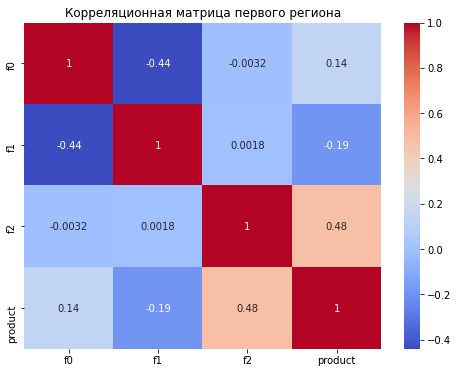

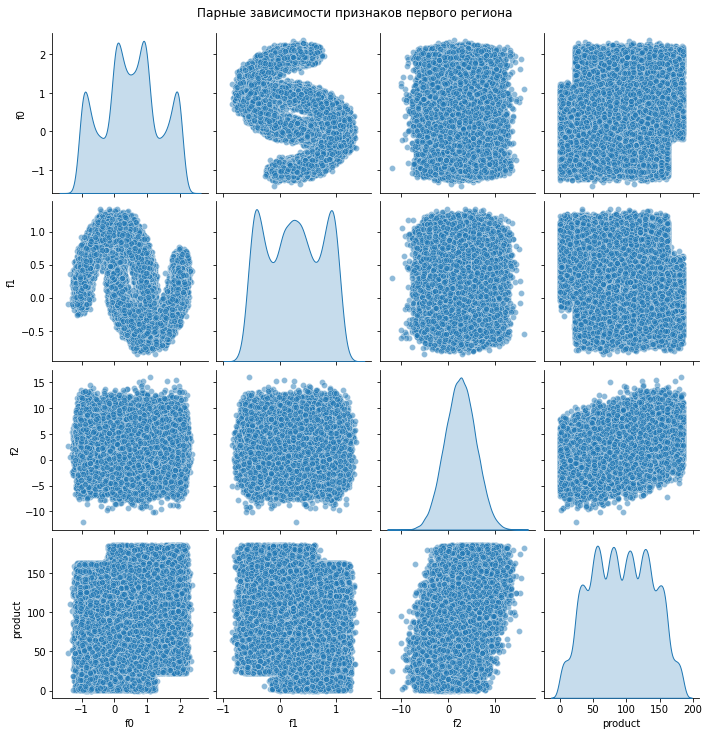

In [19]:
# Проведем корреляционный анализ для первого региона

print(geo_data_0.corr()) # печать корреляционной матрицы

# Тепловая карта корреляций
plt.figure(figsize=(8, 6))
sns.heatmap(geo_data_0.corr(), annot=True, cmap='coolwarm')  # добавляем аннотации числами внутри клеток
plt.title('Корреляционная матрица первого региона')
plt.show()

# Парные графики зависимостей признаков
sns.pairplot(geo_data_0, diag_kind='kde', kind='scatter', plot_kws={'alpha': 0.5}, height=2.5)
plt.suptitle('Парные зависимости признаков первого региона', y=1.02)  # добавляем общий заголовок над всеми параграфами
plt.show()

               f0        f1        f2   product
f0       1.000000  0.182279 -0.001810 -0.030523
f1       0.182279  1.000000 -0.002594 -0.010154
f2      -0.001810 -0.002594  1.000000  0.999397
product -0.030523 -0.010154  0.999397  1.000000


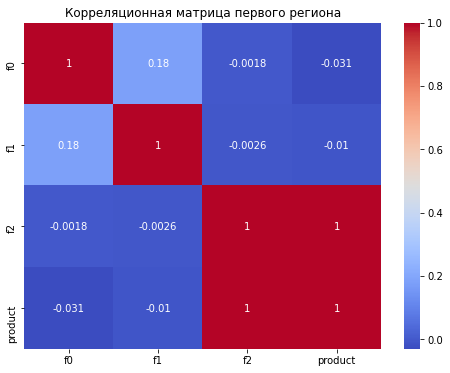

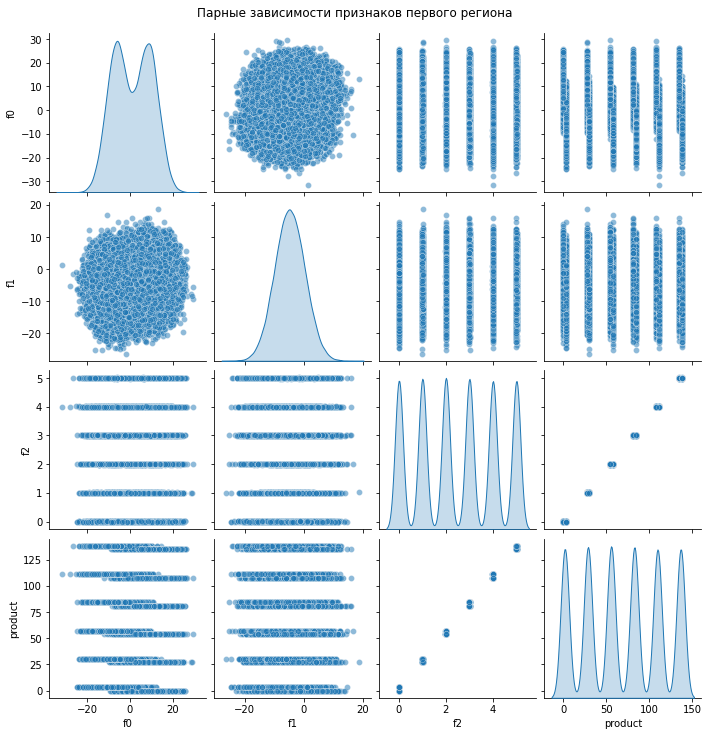

In [20]:
# Проведем корреляционный анализ для второго региона

print(geo_data_1.corr()) # печать корреляционной матрицы

# Тепловая карта корреляций
plt.figure(figsize=(8, 6))
sns.heatmap(geo_data_1.corr(), annot=True, cmap='coolwarm')  # добавляем аннотации числами внутри клеток
plt.title('Корреляционная матрица первого региона')
plt.show()

# Парные графики зависимостей признаков
sns.pairplot(geo_data_1, diag_kind='kde', kind='scatter', plot_kws={'alpha': 0.5}, height=2.5)
plt.suptitle('Парные зависимости признаков первого региона', y=1.02)  # добавляем общий заголовок над всеми параграфами
plt.show()

               f0        f1        f2   product
f0       1.000000  0.000506 -0.000452 -0.001978
f1       0.000506  1.000000  0.000753 -0.001055
f2      -0.000452  0.000753  1.000000  0.445867
product -0.001978 -0.001055  0.445867  1.000000


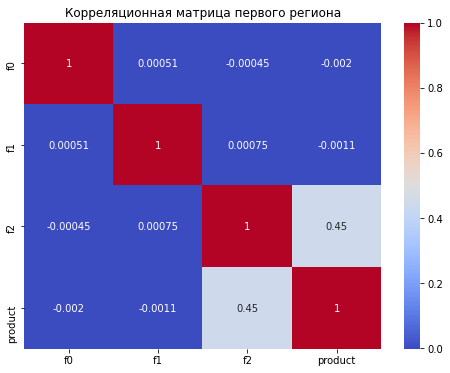

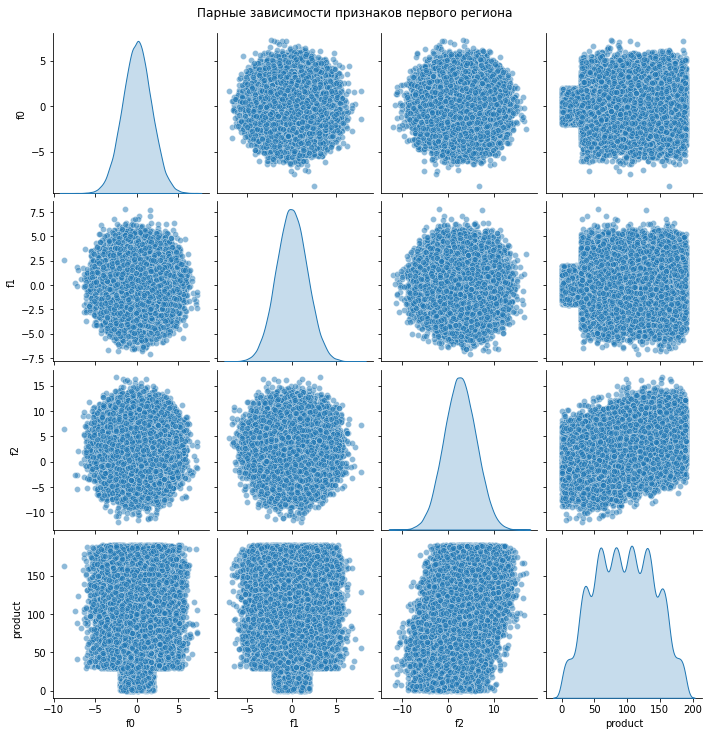

In [21]:
# Проведем корреляционный анализ для третьего региона

print(geo_data_2.corr()) # печать корреляционной матрицы

# Тепловая карта корреляций
plt.figure(figsize=(8, 6))
sns.heatmap(geo_data_2.corr(), annot=True, cmap='coolwarm')  # добавляем аннотации числами внутри клеток
plt.title('Корреляционная матрица первого региона')
plt.show()

# Парные графики зависимостей признаков
sns.pairplot(geo_data_2, diag_kind='kde', kind='scatter', plot_kws={'alpha': 0.5}, height=2.5)
plt.suptitle('Парные зависимости признаков первого региона', y=1.02)  # добавляем общий заголовок над всеми параграфами
plt.show()

**Комментарии**

По результатам корреляционного анализа можно сделать следующие выводы:
- Признаков мультиколлинеарности в данных для первого региона не обнаружено. Имеется умеренная положительная зависимость между входных признаком и признаком `f2`, а также слабая отрицательная с признаком `f1`. Признаки `f1` и `f0` имеют умеренную отрицательную корреляцию.
- В данных для второго региона имеется мультиколлинеарности между входным признаком и признаком `f2`, связь с остальными признаками практически отсутствует. 
- Признаков мультиколлинеарности в данных для третьего региона также не обнаружено. Имеется умеренная положительная зависимость между входных признаком и признаком `f2`. Взаимосвязи остальных признаков между собой отсутствуют.

**Выводы**

Полученные данные мы сохранили в три переменные для трех разных регионов: `geo_data_0`, `geo_data_1` и `geo_data_2`. В датафреймах отсутствуют пропуски и явные дубликаты, типы данных распределены корректно. Были обработаны неявные дубликаты по столбцу `id`. Также на текущем этапе для дальнейшего обучения модели столбец `id` был переведён в индексы.

Целевой признак `product` не имеет тип нормального распределения, в гистограммах имеется множество вершин, но выбросов нет. Более того, во втором регионе гистограмма выглядит странно и имеет множество пробелов. Распределения большей части входных признаков для первого и второго регионов также не имеют нормального распределения. Такие характеристики признаков могут быть объяснены тем, что по условию задачи данные синтетические. Корреляционный анализ показал, что имеется выраженная связь между целевым признаком и признаком `f2` для всех трех регионов. 

## Обучение и анализ модели

### Подготовка данных для обучения модели


In [22]:
# Удаляем целевой признак

X_geo_0 = geo_data_0.drop('product', axis=1)
X_geo_1 = geo_data_1.drop('product', axis=1)
X_geo_2 = geo_data_2.drop('product', axis=1)

# Сохраняем целевые признаки

y_geo_0 = geo_data_0['product']
y_geo_1 = geo_data_1['product']
y_geo_2 = geo_data_2['product']

### Обучение модели `LinearRegression`

**Комментарии**

Поскольку мы имеем три датафрейма, имеет смысл написать единую функцию для обучения моделей. Применим стандартизацию для количественных переменных для каждой разделенной выборки, а за ключевую метрику для регрессионной модели возьмем RMSE, которая точнее остальных покажет фактическое отклонение от реальных значений.

Функция разделяет загруженный набор данных на обучающую и валидационные выборки в соотношении 75:25, применяет стандартизацию для всех выборок по количественным признакам, обучает модель линейной регрессии, записывает предсказания модели, выводит на экран средний запас сырья в определенном регионе и среднюю квадратичную ошибку модели.
   

In [23]:
# Функция для обучения модели

def ml_model(X, y, region_name): # region_name - название региона (str)
    
    # разбиваем данные на обучающую и валидационную выборки в соотношении 75:25.
    X_train, X_valid, y_train, y_valid = train_test_split(
        X,
        y,
        random_state=RANDOM_STATE,
        test_size=0.25,
    )
    scaler = StandardScaler()
    numerics = ['f0', 'f1', 'f2'] # выбираем только количественные переменные
    X_train.loc[:, numerics] = scaler.fit_transform(X_train[numerics])
    X_valid.loc[:, numerics] = scaler.transform(X_valid[numerics])
    
    model = LinearRegression() # обучаем модель
    model.fit(X_train, y_train)
    predicted = model.predict(X_valid) # делаем предсказания на валидационной выборке
    
    print(f'Средний запас сырья в {region_name}:', predicted.mean()) # средний запас предсказанного сырья
    print('RMSE модели:', mean_squared_error(y_valid, predicted, squared=False)) # RMSE модели
    print('------')
    
    df = pd.DataFrame([], columns=['correct', 'predicted']) # сохраните предсказания и правильные ответы
    df['correct'] = y_valid
    df['predicted'] = predicted
    
    return pd.Series(predicted), pd.Series(y_valid), df

In [24]:
%%time
# Обучаем модели и сохраняем результаты

with warnings.catch_warnings():
    warnings.simplefilter("ignore") # скрываем предупреждения для выводы результата
    predicted_geo_0, correct_geo_0, df_geo_0 = ml_model(X_geo_0, y_geo_0, 'Регионе 1')
    predicted_geo_1, correct_geo_1, df_geo_1 = ml_model(X_geo_1, y_geo_1, 'Регионе 2')
    predicted_geo_2, correct_geo_2, df_geo_2 = ml_model(X_geo_2, y_geo_2, 'Регионе 3')



Средний запас сырья в Регионе 1: 92.60984027552017
RMSE модели: 37.68508926201444
------
Средний запас сырья в Регионе 2: 68.57703454115173
RMSE модели: 0.8928265978121422
------
Средний запас сырья в Регионе 3: 94.93478722287514
RMSE модели: 40.080822438088305
------
CPU times: user 494 ms, sys: 184 ms, total: 678 ms
Wall time: 685 ms


In [25]:
# Сохраняем индексацию предсказанных и реальных значений

predicted_geo_0.index = correct_geo_0.index
predicted_geo_1.index = correct_geo_1.index
predicted_geo_2.index = correct_geo_2.index


**Выводы**

На текущем этапе исследования была обучена модель линейной регрессии для предсказания объема сырья в регионах. Наибольший запас предсказанного сырья у третьего региона (94.93), на втором месте немного меньший запас имеет первый регион (92.60). Наименьший запас у второго региона (68.57).

При этом важно отметить, что именно у второго региона модель работает точнее всего (значение метрики RMSE меньше единицы, а чем ближе значение метрики к нулю, тем точнее модель). У других регионов значение метрики около 40.

## Расчёт прибыли и рисков 

### Подготовка к расчёту прибыли

In [26]:
# Сохраним ключевые значения для расчётов 

TOTAL_WELLS = 500 # при разведке исследуют 500 скважин
BEST_WELLS = 200 # для разработки выбирают 200 лучших скважин
TOTAL_BUDGET = 10000000000 # бюджет на разработку скважин 10 млрд. рублей
INCOME = 450000 # доход с единицы продукта

In [27]:
# Рассчитаем достаточный объём сырья для безубыточной разработки новой скважины

budget_one = TOTAL_BUDGET / BEST_WELLS # сколько выделяется денег на одну скважину
volume = budget_one / INCOME # сколько нужно единиц продукта, чтобы потрать весь бюджет

print(f'Необходимое кол-во единиц продукта для безубыточности: {volume:.2f} тыс.баррелей.')

Необходимое кол-во единиц продукта для безубыточности: 111.11 тыс.баррелей.


**Комментарии**

Для безубыточной разработки новой скважины необходимо, чтобы объем продукта был не меньше, чем 111.11 тыс.баррелей. Если объем будет меньше, то затраты на бурение не окупятся. Средние запасы в каждом из трех регионов меньше, чем рассчитанный безубыточный объем. В связи с этим существуют определенные риски убытков, но также возможно, что в 200 лучших скважинах может быть достаточный объем продукта. В следующем этапе мы создадим функцию для подсчета прибыли в лучших отобранных скважинах.

### Расчёт прибыли и анализ рисков


In [28]:
# Создадим функцию для расчета прибыли

def income_count(target, predicted):
    
    income = INCOME
    total_budget = TOTAL_BUDGET

    best = predicted.sort_values(ascending=False) # сортируем предсказания и выбираем Топ200 скважин
    selected = target[best.index].head(200) # по индексу выбираем значения соответствующие Топ200 скважин
    #print(len(selected))
    return selected.sum() * income - total_budget # считаем прибыль

In [29]:
# Создадим функцию для Bootstrap

def bootstrap(target, predicted, region_name): # region_name - название региона (str)

    state = np.random.RandomState(12345)
    
    values = []
    for i in range(1000):
        target_subsample = target.sample(n=500, replace=True, random_state=state) # исследуются 500 скважин
        probs_subsample = predicted[target_subsample.index]
        profit = income_count(target_subsample, probs_subsample) # считаем прибыль
        values.append(profit)

    values = pd.Series(values)
    lower = values.quantile(0.025) # нижняя граница доверительного интервала
    upper = values.quantile(0.975) # верхняя граница доверительного интервала
    mean = values.mean() # средняя прибыль
    risk = (values < 0).mean() # вероятность риска

    print(f'Результат для {region_name}:')
    print(f'Средняя прибыль: {mean / 1000000} млн')
    print(f'Нижняя граница: {lower / 1000000} млн')
    print(f'Верхняя граница: {upper/ 1000000} млн')
    print(f'Риск убытка: {risk:.2%}')
    print('------')
    
    return values


In [30]:
%%time
# Применим технику Bootstrap для подсчета прибыли и рисков

values_geo_0 = bootstrap(correct_geo_0, predicted_geo_0, 'Региона 1')
values_geo_1 = bootstrap(correct_geo_1, predicted_geo_1, 'Региона 2')
values_geo_2 = bootstrap(correct_geo_2, predicted_geo_2, 'Региона 3')


Результат для Региона 1:
Средняя прибыль: 447.53018481315695 млн
Нижняя граница: -91.01246299911627 млн
Верхняя граница: 997.5437559144923 млн
Риск убытка: 5.30%
------
Результат для Региона 2:
Средняя прибыль: 491.06852563676466 млн
Нижняя граница: 95.22884967186341 млн
Верхняя граница: 960.0724347395046 млн
Риск убытка: 0.70%
------
Результат для Региона 3:
Средняя прибыль: 383.78604012672326 млн
Нижняя граница: -180.21770384705738 млн
Верхняя граница: 916.9808053193082 млн
Риск убытка: 7.80%
------
CPU times: user 6.08 s, sys: 0 ns, total: 6.08 s
Wall time: 6.09 s


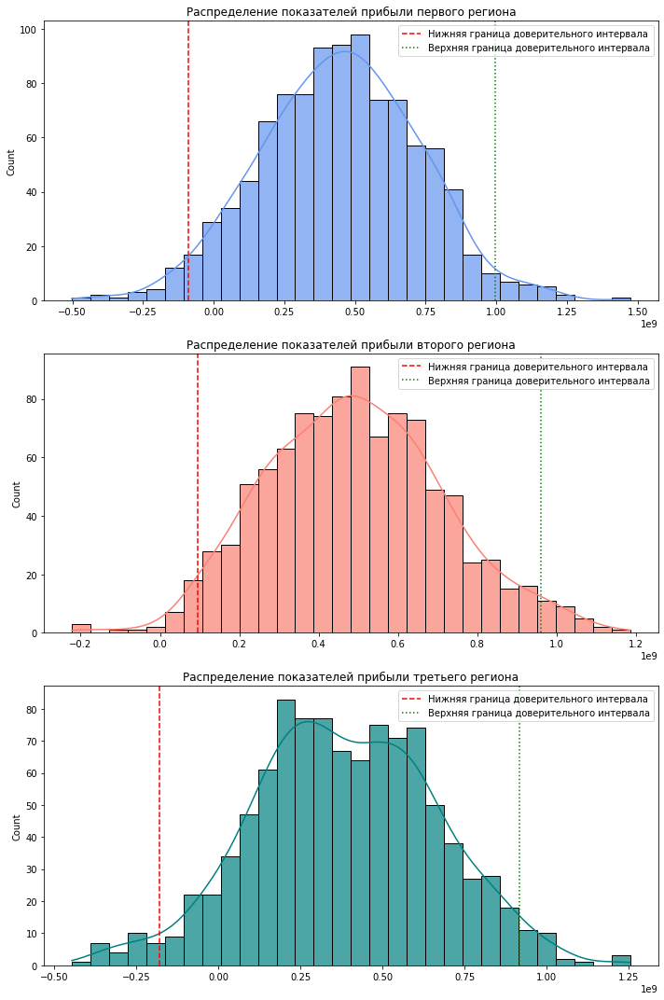

In [31]:
# Построим гистограммы распределения прибыли для трех регионов на одном графике.

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

# Первая гистограмма (Первый регион)
sns.histplot(values_geo_0, bins=30, kde=True, color="CornflowerBlue", alpha=0.7, ax=axes[0])  
axes[0].axvline(x=values_geo_0.quantile(0.025), color="red", linestyle="--", label="Нижняя граница доверительного интервала")  
axes[0].axvline(x=values_geo_0.quantile(0.975), color="green", linestyle=":", label="Верхняя граница доверительного интервала")   
axes[0].set_title("Распределение показателей прибыли первого региона")
axes[0].legend()

# Вторая гистограмма (Второй регион)
sns.histplot(values_geo_1, bins=30, kde=True, color="salmon", alpha=0.7, ax=axes[1]) 
axes[1].axvline(x=values_geo_1.quantile(0.025), color="red", linestyle="--", label="Нижняя граница доверительного интервала")
axes[1].axvline(x=values_geo_1.quantile(0.975), color="green", linestyle=":", label="Верхняя граница доверительного интервала")
axes[1].set_title("Распределение показателей прибыли второго региона")
axes[1].legend()

# Третья гистограмма (Третий регион)
sns.histplot(values_geo_2, bins=30, kde=True, color="teal", alpha=0.7, ax=axes[2])  
axes[2].axvline(x=values_geo_2.quantile(0.025), color="red", linestyle="--", label="Нижняя граница доверительного интервала")
axes[2].axvline(x=values_geo_2.quantile(0.975), color="green", linestyle=":", label="Верхняя граница доверительного интервала")
axes[2].set_title("Распределение показателей прибыли третьего региона")
axes[2].legend()

plt.tight_layout()  
plt.show()

**Выводы**

Единственный регион с вероятностью убытков меньше 2.5% - это Регион 2. В доверительном интервале нет отрицательных значений, значит 95% значений - прибыль, а не убытки. Среднее значение прибыли в этом регионе - 491.068, поэтому именно этот регион лучше всего подойдёт для разработки.

## Выводы 

Для настоящего проекта нам были предоставлены данные добывающей компании «ГлавРосГосНефть».

**Цель исследования**: Построить модель машинного обучения для предсказания объёма запасов в новых скважинах. Проанализировать возможную прибыль и риски техникой Bootstrap.

В **первом разделе** мы загрузили данные, изучили общую информацию, и подготовили их к дальнейшему обучению модели. Для анализа нам было предоставлено три датасета, которые включали данные геологоразведки трёх регионов со следующими признаками:
- `id` —  уникальный идентификатор скважины;
- `f0`, `f1`, `f2` — три признака точек (неважно, что они означают, но сами признаки значимы);
- `product` — объём запасов в скважине (тыс. баррелей);

Полученные данные мы сохранили в три переменные для трех разных регионов: `geo_data_0`, `geo_data_1` и `geo_data_2`. В датафреймах отсутствуют пропуски и явные дубликаты, типы данных распределены корректно. Были обработаны неявные дубликаты по столбцу `id`. Также на текущем этапе для дальнейшего обучения модели столбец `id` был переведён в индексы.

Целевой признак `product` не имеет тип нормального распределения, в гистограммах имеется множество вершин, но выбросов нет. Более того, во втором регионе гистограмма выглядит странно и имеет множество пробелов. Распределения большей части входных признаков для первого и второго регионов также не имеют нормального распределения. Такие характеристики признаков могут быть объяснены тем, что по условию задачи данные синтетические. Корреляционный анализ показал, что имеется выраженная связь между целевым признаком и признаком `f2` для всех трех регионов. 

Во **втором разделе** была обучена модель линейной регрессии для предсказания объема сырья в регионах. Наибольший запас предсказанного сырья у третьего региона (94.93), на втором месте немного меньший запас имеет первый регион (92.60). Наименьший запас у второго региона (68.57). При этом важно отметить, что именно у второго региона модель работает точнее всего (значение метрики RMSE меньше единицы, а чем ближе значение метрики к нулю, тем точнее модель). У других регионов значение метрики около 40.

В **третьем разделе** мы провели расчет прибыли и анализ рисков. Для этого в начале был рассчитан достаточный объем сырья для безубыточной разработки новой скважины, который составил 111.11 тыс.баррелей. Если объем будет меньше, то затраты на бурение не окупятся. 
Далее мы использовали технику Bootstrap для подсчета прибыли и рисков. Единственный регион с вероятностью убытков меньше 2.5% - это Регион 2. В доверительном интервале нет отрицательных значений, значит 95% значений - прибыль, а не убытки. Среднее значение прибыли в этом регионе - 491.068, поэтому именно этот регион лучше всего подойдёт для разработки.

Таким образом, по итогам проведенного анализа была построена модель машинного обучения, способная определить регион, где добыча принесет наибольшую прибыль и наименьшие риски. 
